In [2]:
import sys
import os

repo_root = os.path.abspath(os.path.join(os.getcwd(), "..", ".."))
sys.path.append(repo_root)

from eda.visualisation import ImageEDA

data_dir = os.path.join(repo_root, 'data', 'images')

eda = ImageEDA(data_dir, category_delimiter="_")

# Klassendistribution

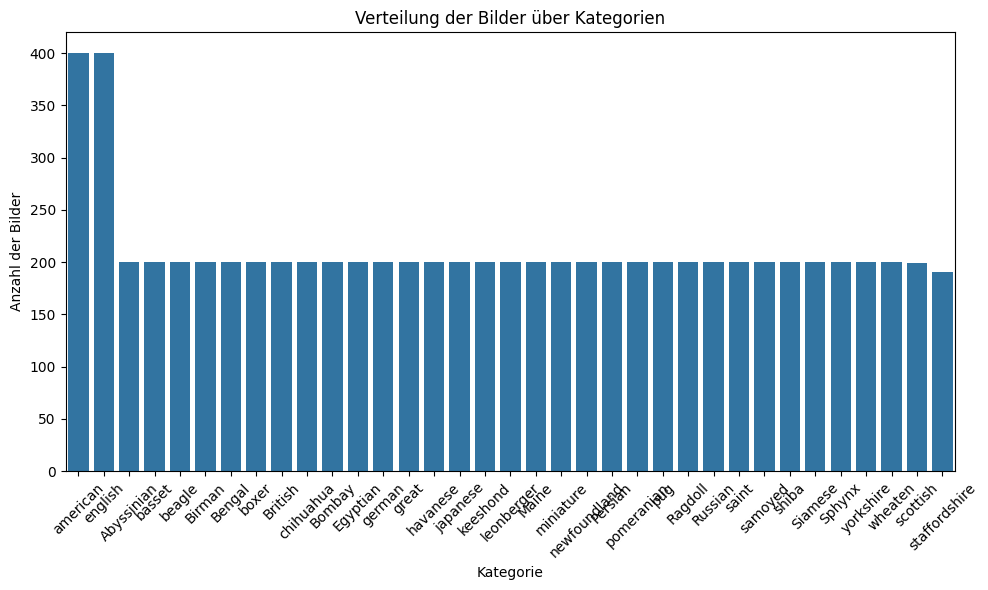

Gesamtzahl der Kategorien: 35
Gesamtzahl der Bilder: 7390
Aufschlüsselung nach Kategorien:
category
american         400
english          400
Abyssinian       200
basset           200
beagle           200
Birman           200
Bengal           200
boxer            200
British          200
chihuahua        200
Bombay           200
Egyptian         200
german           200
great            200
havanese         200
japanese         200
keeshond         200
leonberger       200
Maine            200
miniature        200
newfoundland     200
Persian          200
pomeranian       200
pug              200
Ragdoll          200
Russian          200
saint            200
samoyed          200
shiba            200
Siamese          200
Sphynx           200
yorkshire        200
wheaten          200
scottish         199
staffordshire    191
Name: count, dtype: int64


In [3]:
eda.show_class_distribution()

# Random Stichproben von jeder Kategorie

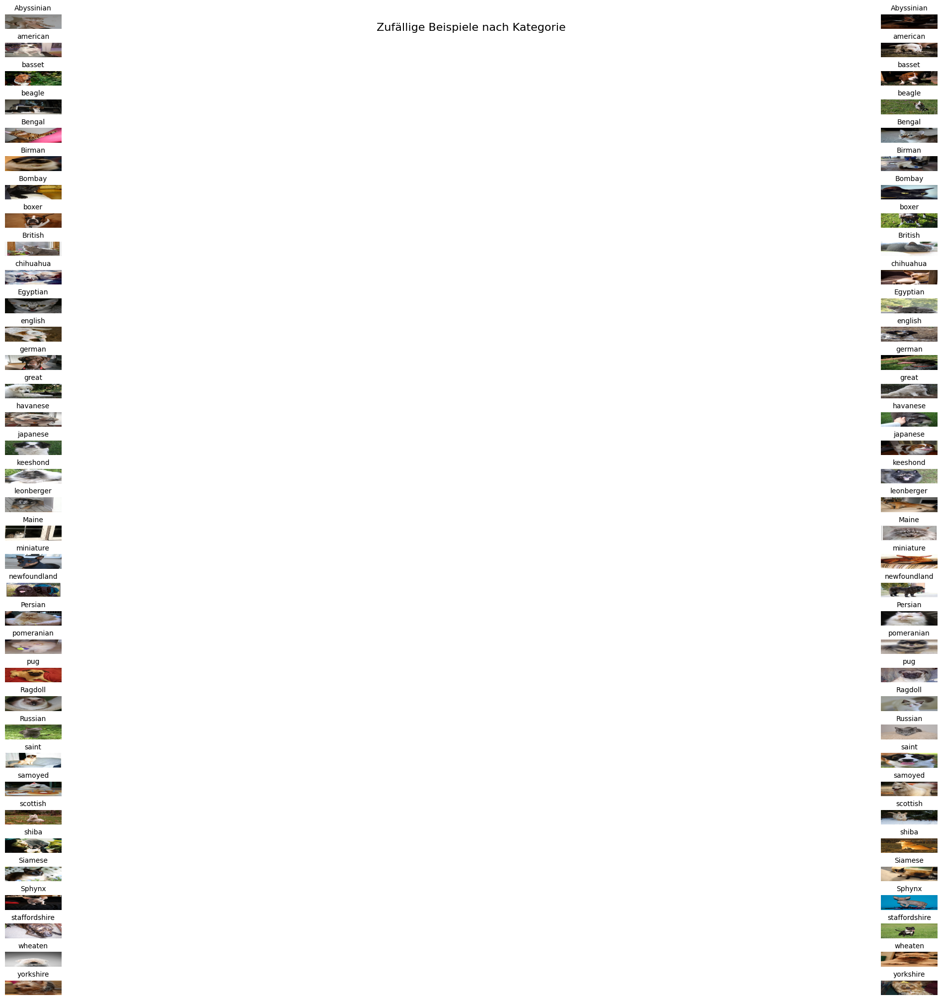

In [16]:
eda.show_random_samples(samples_per_category=2)

# Analyse der Bilddimensionen

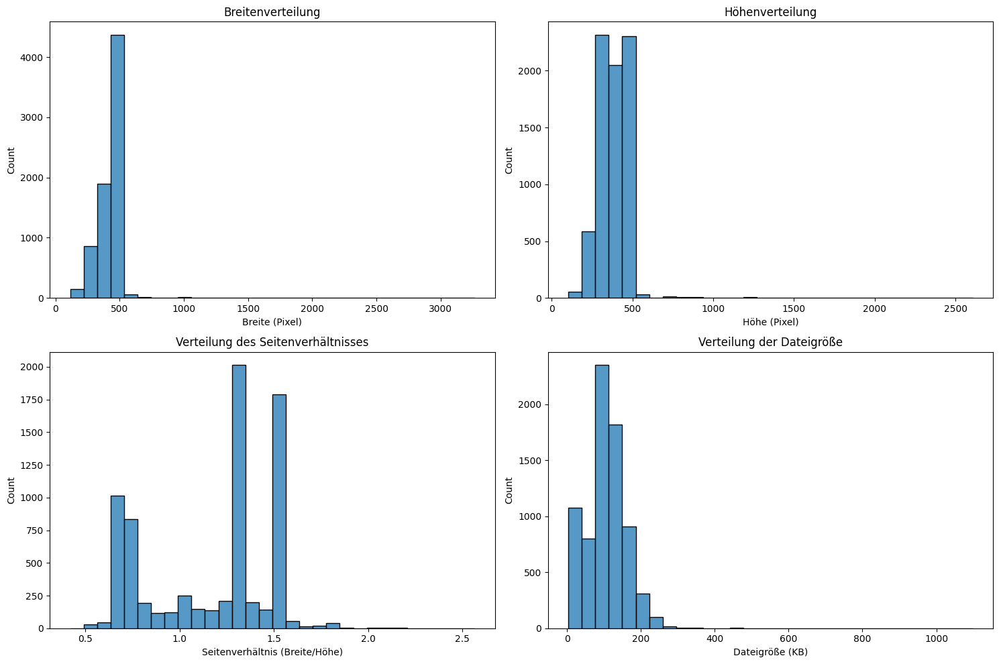

Statistiken der Bildabmessungen:
             width       height  aspect_ratio    file_size
count  7390.000000  7390.000000   7390.000000  7390.000000
mean    436.745196   390.913667      1.172343   104.737160
std     115.877300   109.586324      0.329376    57.367767
min     114.000000   103.000000      0.420000     3.344727
25%     335.000000   333.000000      0.751116    75.816650
50%     500.000000   375.000000      1.333333   105.112793
75%     500.000000   500.000000      1.492537   135.823242
max    3264.000000  2606.000000      2.564103  1098.778320


In [5]:
eda.analyze_image_dimensions()

# Analyse der Dominanten Farben pro Kategorie

c:\Users\fabud\Documents\GitHub\dlbs-mc-oliver-fabian\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


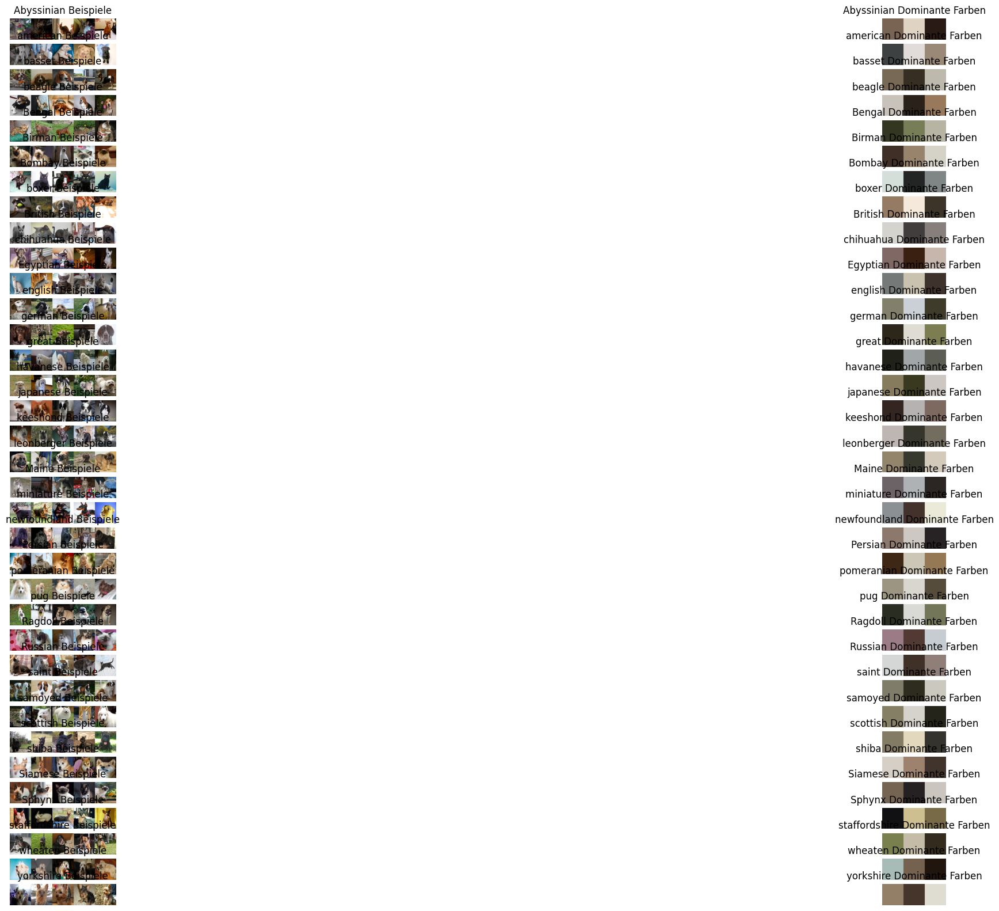

In [14]:
eda.analyze_colors_by_category(samples_per_category=5, n_colors=3)

# Augmenation Beispiele

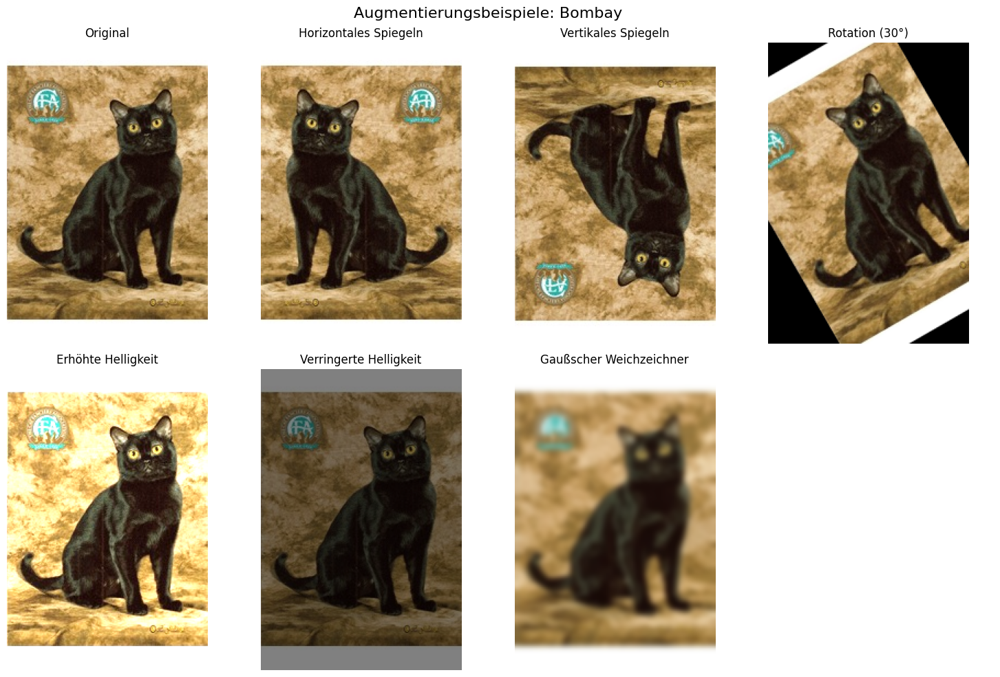

In [7]:
eda.show_augmentation_examples()

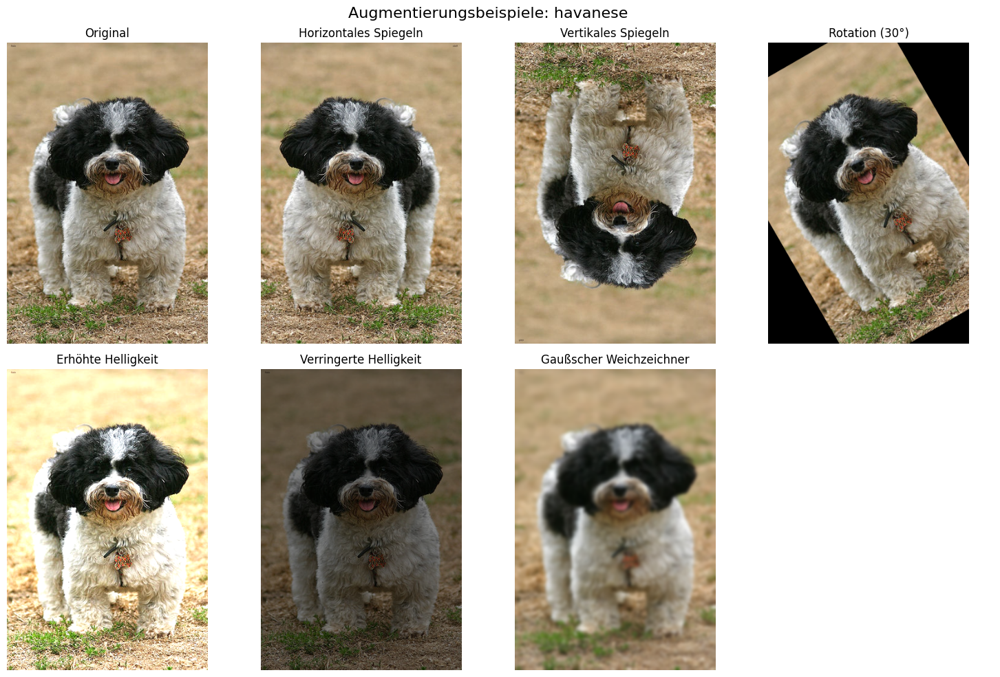

In [8]:
eda.show_augmentation_examples()

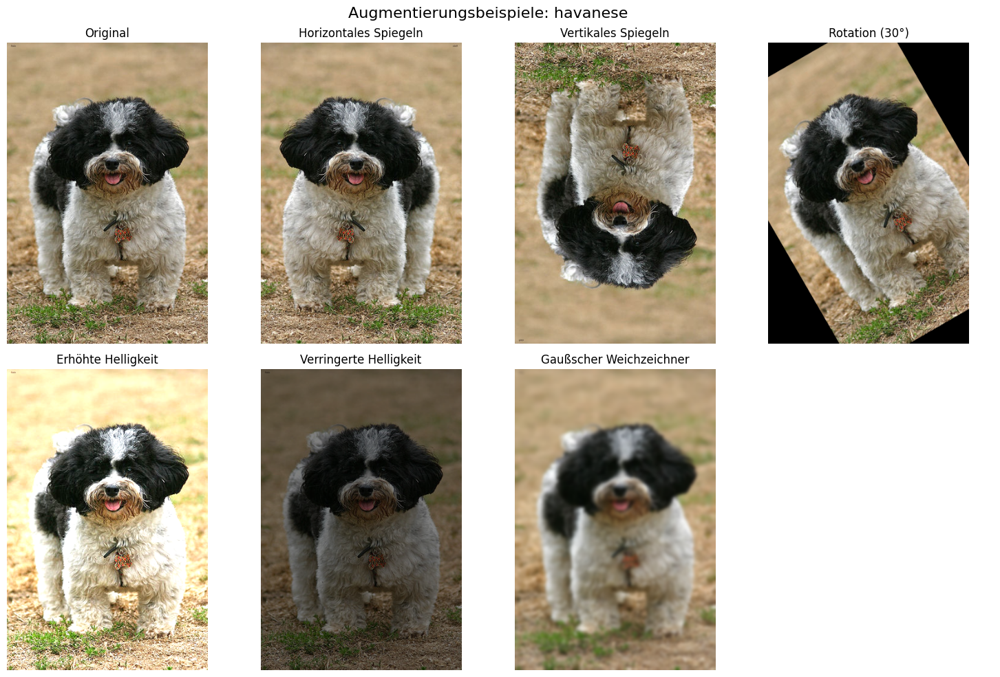

In [9]:
eda.show_augmentation_examples()

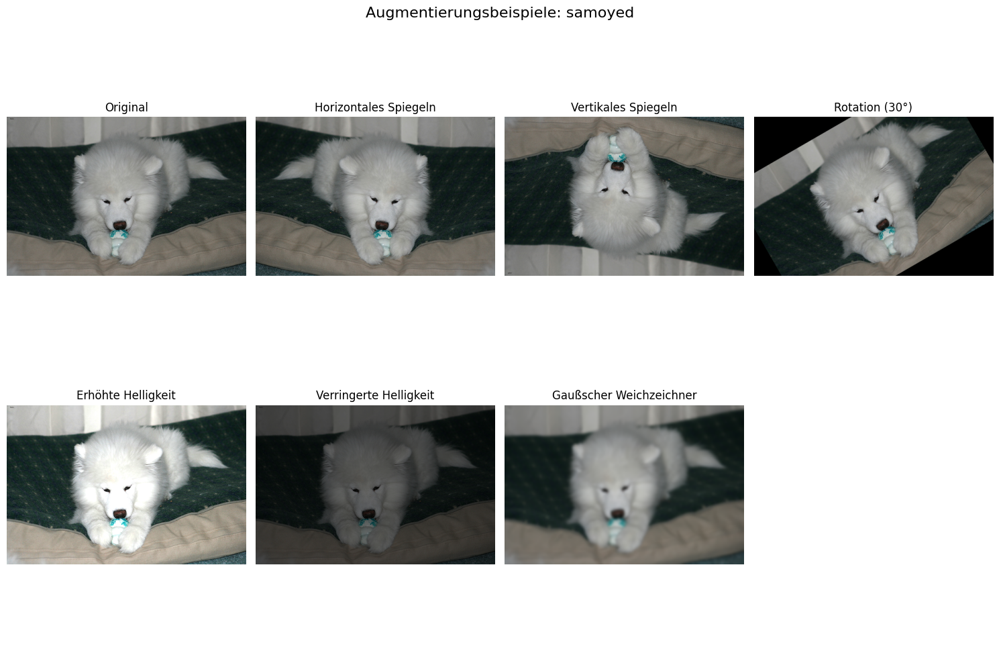

In [10]:
eda.show_augmentation_examples()

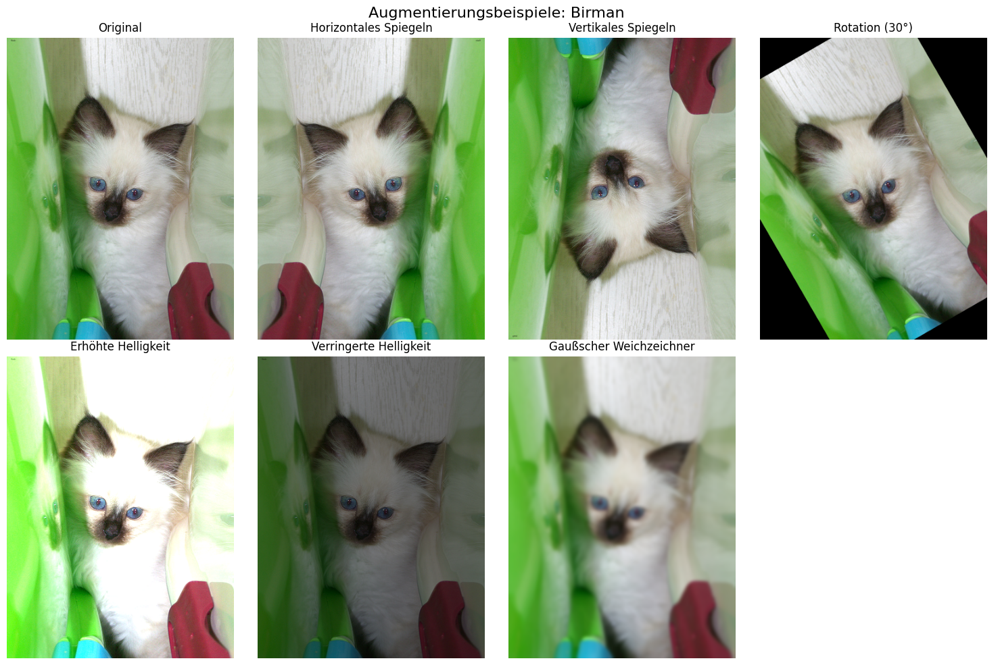

In [11]:
eda.show_augmentation_examples()

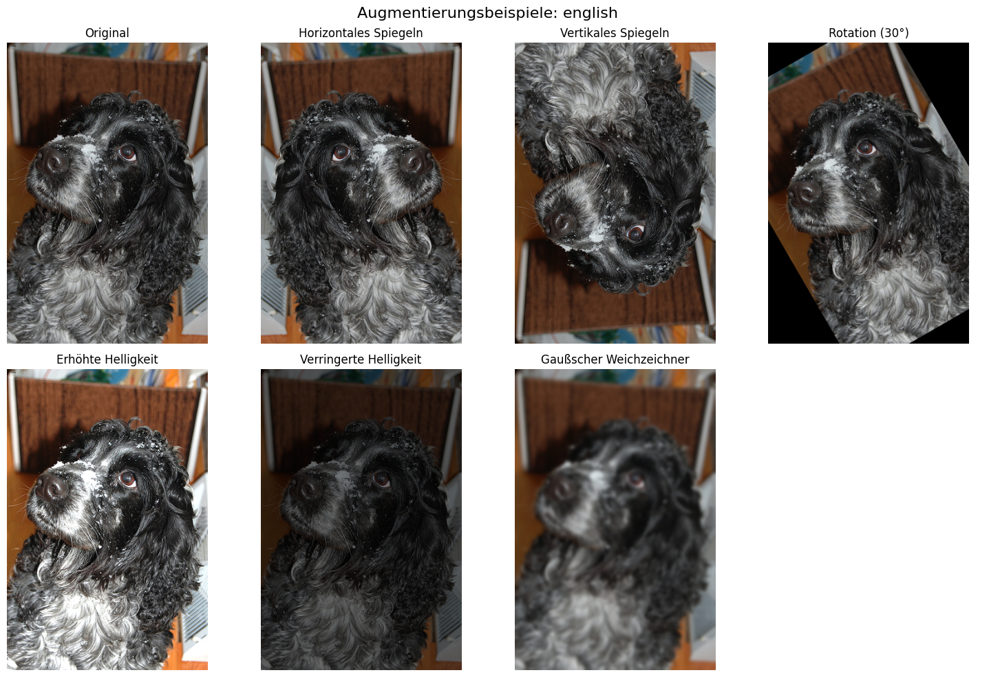

In [12]:
eda.show_augmentation_examples()

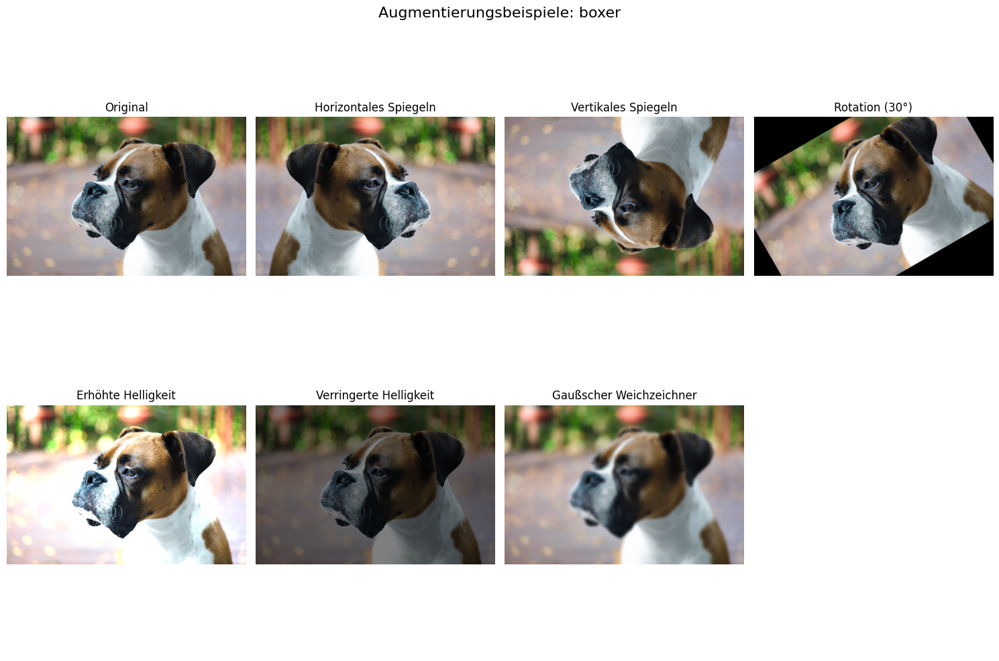

In [13]:
eda.show_augmentation_examples()

In [ ]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def prüfe_ground_truth_bilder(bilder_dir, gt_dir, original_muster="*.jpg", gt_muster="*.png"):
    """
    Überprüft, ob jedes Bild im Datensatz ein entsprechendes Ground-Truth-Bild hat.
    
    Args:
        bilder_dir (str): Verzeichnis mit den Originalbildern
        gt_dir (str): Verzeichnis mit den Ground-Truth-Bildern
        original_muster (str): Muster für die Suche nach Originalbildern
        gt_muster (str): Muster für die Suche nach Ground-Truth-Bildern
    
    Returns:
        pandas.DataFrame: DataFrame mit Informationen über Bilder und ihren Ground-Truth-Status
    """
    bilder_dir = Path(bilder_dir)
    gt_dir = Path(gt_dir)
    
    # Überprüfe, ob die Verzeichnisse existieren
    if not bilder_dir.exists():
        print(f"Warnung: Bilder-Verzeichnis existiert nicht: {bilder_dir}")
        return pd.DataFrame()
    
    if not gt_dir.exists():
        print(f"Warnung: Ground-Truth-Verzeichnis existiert nicht: {gt_dir}")
        return pd.DataFrame()
    
    # Finde alle Originalbilder
    original_bilder = list(bilder_dir.glob(f"**/{original_muster}"))
    print(f"Gefundene Originalbilder: {len(original_bilder)}")
    
    # Finde alle Ground-Truth-Bilder und erstelle ein Set mit ihren Stammnamen
    gt_bilder = list(gt_dir.glob(f"**/{gt_muster}"))
    print(f"Gefundene Ground-Truth-Bilder: {len(gt_bilder)}")
    
    gt_stammnamen = {gt_pfad.stem for gt_pfad in gt_bilder}
    
    ergebnisse = []
    
    for bild_pfad in original_bilder:
        # Extrahiere den Stammnamen des Bildes
        bild_stamm = bild_pfad.stem
        
        # Überprüfe, ob ein entsprechendes Ground-Truth-Bild existiert
        hat_gt = bild_stamm in gt_stammnamen
        
        # Finde den Pfad des Ground-Truth-Bildes, falls vorhanden
        gt_pfad = ""
        if hat_gt:
            for gt in gt_bilder:
                if gt.stem == bild_stamm:
                    gt_pfad = str(gt)
                    break
        
        ergebnisse.append({
            'bild_pfad': str(bild_pfad),
            'gt_pfad': gt_pfad,
            'hat_ground_truth': hat_gt
        })
    
    # Erstelle DataFrame
    df = pd.DataFrame(ergebnisse)
    
    # Zusammenfassende Statistiken
    gesamt_bilder = len(df)
    bilder_mit_gt = df['hat_ground_truth'].sum() if 'hat_ground_truth' in df.columns and not df.empty else 0
    prozentsatz = (bilder_mit_gt / gesamt_bilder * 100) if gesamt_bilder > 0 else 0
    
    print(f"Gesamtanzahl Bilder: {gesamt_bilder}")
    print(f"Bilder mit Ground-Truth: {bilder_mit_gt} ({prozentsatz:.2f}%)")
    
    return df

# Definiere die korrekten Verzeichnispfade
# Gehe zwei Ebenen höher, da wir in notebooks/eda sind
projekt_verzeichnis = Path.cwd().parent.parent

# Definiere die Pfade relativ zum Projektverzeichnis
bilder_verzeichnis = projekt_verzeichnis / "data" / "images"
gt_verzeichnis = projekt_verzeichnis / "data" / "groundtruth" / "annotations" / "trimaps"

# Gib die Pfade aus, um zu überprüfen, ob sie korrekt sind
print(f"Bilder-Verzeichnis: {bilder_verzeichnis}")
print(f"Ground-Truth-Verzeichnis: {gt_verzeichnis}")

# Überprüfe, ob die Verzeichnisse existieren
if not bilder_verzeichnis.exists():
    print(f"Fehler: Bilder-Verzeichnis existiert nicht!")
if not gt_verzeichnis.exists():
    print(f"Fehler: Ground-Truth-Verzeichnis existiert nicht!")

# Verwende die Funktion mit den spezifischen Verzeichnissen, nur wenn beide Verzeichnisse existieren
if bilder_verzeichnis.exists() and gt_verzeichnis.exists():
    gt_ergebnisse = prüfe_ground_truth_bilder(
        bilder_dir=bilder_verzeichnis,
        gt_dir=gt_verzeichnis,
        original_muster="*.jpg",  # Anpassen je nach Bildformat
        gt_muster="*.png"         # Anpassen je nach Ground-Truth-Format
    )

    # Zeige Ergebnisse an, nur wenn der DataFrame nicht leer ist
    if not gt_ergebnisse.empty:
        display(gt_ergebnisse.head())
        
        # Filtere Bilder ohne Ground-Truth
        fehlende_gt = gt_ergebnisse[~gt_ergebnisse['hat_ground_truth']]
        print(f"Anzahl der Bilder ohne Ground-Truth: {len(fehlende_gt)}")
        
        # Visualisiere die Ergebnisse
        plt.figure(figsize=(10, 6))
        sns.countplot(data=gt_ergebnisse, x='hat_ground_truth')
        plt.title('Anzahl der Bilder mit und ohne Ground-Truth')
        plt.xlabel('Hat Ground-Truth')
        plt.ylabel('Anzahl')
        plt.xticks([0, 1], ['Nein', 'Ja'])
        plt.show()
else:
    print("Die Überprüfung kann nicht durchgeführt werden, da mindestens ein Verzeichnis nicht existiert.")

Bilder-Verzeichnis: c:\Users\fabud\Documents\GitHub\dlbs-mc-oliver-fabian\notebooks\data\images
Ground-Truth-Verzeichnis: c:\Users\fabud\Documents\GitHub\dlbs-mc-oliver-fabian\notebooks\data\groundtruth\annotations\trimaps
Fehler: Bilder-Verzeichnis existiert nicht!
Fehler: Ground-Truth-Verzeichnis existiert nicht!
Die Überprüfung kann nicht durchgeführt werden, da mindestens ein Verzeichnis nicht existiert.
